In [1]:
import cartopy
import geoviews.feature as gf
import hvplot.xarray
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import panel as pn
import xarray as xr
from matplotlib.colors import LinearSegmentedColormap

# pn.extension(loading_spinner='dots', loading_color='black')
pn.param.ParamMethod.loading_indicator = True
pn.extension(loading_spinner="dots", loading_color="black")

mpl.rcParams["font.sans-serif"] = "Arial"

cm_data = np.loadtxt("./utils/bamako.txt")[::-1]
bamako_map = LinearSegmentedColormap.from_list("bamako", cm_data, N=10)

In [2]:
# Read cities
city_list = pd.read_csv("./data/simplemaps_worldcities_basicv1.76/worldcities_subset.csv")

In [3]:
#############
## Text
#############

In [4]:
# Title bar
pches_logo = """
<a href="https://www.pches.psu.edu/">
  <img src="https://raw.githubusercontent.com/david0811/uc_dashboard_example/main/data/figs/pches-logo-horizontal-color.png" alt="PCHES" style="width:350px">
</a>
"""

uiuc_logo = """
<a href="https://illinois.edu/">
  <img src="https://raw.githubusercontent.com/david0811/uc_dashboard_example/main/data/figs/University-Wordmark-Full-Color-RGB-TM.png" alt="UIUC" style="width:210px">
</a>
"""

msdlive_logo = """
<a href="https://msdlive.org/">
  <img src="https://raw.githubusercontent.com/david0811/uc_dashboard_example/e714b6fada15772b2be3160524c580278a5adadf/data/figs/MSD.LIVE.horiz.svg" alt="MSD LIVE" style="width:300px">
</a>
"""
title_text = """
## Downscaling and bias-correction contribute considerable uncertainty to local climate projections in CMIP6

<span style="color:black;font-size:14px">
    <i> David C. Lafferty & Ryan L. Sriver, Unversity of Illinois Urbana-Champaign</i>
</span>
"""

bbar = pn.Column(
    pn.layout.Divider(),
    pn.Row(
        pn.layout.HSpacer(),
        pn.pane.Markdown(pches_logo, margin=(10, 0, 0, 0)),
        pn.layout.HSpacer(),
        pn.pane.Markdown(uiuc_logo, margin=(15, 0, 0, 0)),
        pn.layout.HSpacer(),
        pn.pane.Markdown(msdlive_logo, margin=(17, 0, 0, 0)),
        pn.layout.HSpacer(),
        pn.Row(styles=dict(background="white"), height=50),
    ),
    margin=(0, 0, 20, 0),
)

In [5]:
# Sidebar
body_text = """
This application allows you to explore which sources of uncertainty are the most important for projections of climate change at different locations and time horizons.

There are 3 interactive graphics to choose from:

1. Map plots
2. Timeseries plots
3. Boxplots

For more information about the methods, read the associated paper: 

[Lafferty & Sriver (2023) Downscaling and bias-correction contribute considerable uncertainty to local climate projections in CMIP6](https://doi.org/10.22541/essoar.168286894.44910061/v1)

*Note:* when entering coordinates to look at a specific location or region, latitudes must lie between -60&deg; and 90&deg;, and longitudes between -180&deg; and 180&deg;. Locations over the ocean are also not included in our analysis so they will return blank plots.
"""

sidebar = pn.pane.Markdown(body_text)

In [6]:
################
## Map plot
################

In [7]:
# ## Take temporal averages

# # Averaging periods
# early_start, early_end = 2020, 2039
# mid_start, mid_end = 2050, 2069
# late_start, late_end = 2080, 2099

# # Calculation
# ds_grid_early = ds_grid.sel(time=slice(early_start, early_end)).mean(dim='time').assign_coords(time="early")
# ds_grid_mid = ds_grid.sel(time=slice(mid_start, mid_end)).mean(dim='time').assign_coords(time="mid")
# ds_grid_late = ds_grid.sel(time=slice(late_start, late_end)).mean(dim='time').assign_coords(time="late")

# # Merge and store
# ds_out = xr.concat([ds_grid_early, ds_grid_mid, ds_grid_late], dim='time')
# ds_out.to_netcdf('./data/netcdf/all_metrics_timesliced.nc')

In [8]:
# Read
ds_map = xr.open_dataset("./data/netcdf/all_metrics_timesliced.nc").isel(member_id=0)

In [9]:
# Define user input widgets
map_metric_select = pn.widgets.Select(
    value="Annual Average Temperature",
    options=[
        "Annual Average Temperature",
        "Annual Total Precipitation",
        "Annual Maximum of Daily Maximum Temperature",
        "Annual Maximum 1-Day Precipitation",
        "Annual Number of Extremely Hot Days",
        "Annual Number of Dry Days",
        "Annual Number of Extremely Wet Days",
    ],
    width=350,
)

map_time_select = pn.widgets.Select(
    options=["Early Century (2020-2039)", "Mid-Century (2050-2069)", "Late-Century (2080-2099)"], width=350
)

In [10]:
# Map plotting function
def get_plot(uncertainty, metric, time):
    # For title
    uncertainty_names = {
        "model": "Model Uncertainty",
        "scenario_hs09": "Scenario Uncerainty",
        "ensemble": "Downscaling Uncertainty",
        "variability": "Interannual Variability",
    }
    uncertainty_name = uncertainty_names[uncertainty]

    # Translate user input to metric names
    metric_names = {
        "Annual Average Temperature": "avg_tas",
        "Annual Total Precipitation": "tot_pr",
        "Annual Maximum of Daily Maximum Temperature": "max_tasmax",
        "Annual Maximum 1-Day Precipitation": "max_pr",
        "Annual Number of Extremely Hot Days": "hot_days",
        "Annual Number of Dry Days": "dry_days",
        "Annual Number of Extremely Wet Days": "wet_days",
    }
    metric_name = metric_names[metric]

    # Translate user input to time slice
    time_names = {
        "Early Century (2020-2039)": "early",
        "Mid-Century (2050-2069)": "mid",
        "Late-Century (2080-2099)": "late",
    }
    time_name = time_names[time]

    ds_plot = ds_map.sel(uncertainty=uncertainty, time=time_name).rename({metric_name: uncertainty_name})[
        uncertainty_name
    ]

    return (
        ds_plot.hvplot(
            x="lon",
            y="lat",
            projection=cartopy.crs.PlateCarree(),
            ylim=[-60, 90],
            clim=(0, 100),
            cmap=[mpl.colors.rgb2hex(bamako_map(i)) for i in range(bamako_map.N)],
            coastline=False,
            geo=True,
            rasterize=True,
            project=False,
            dynamic=False,
            colorbar=False,
            xlabel="Longitude",
            ylabel="Latitude",
            frame_width=500,
            frame_height=int(500 / (360 / 140)),
            title=uncertainty_name,
        )
        * gf.borders.geoms("50m").opts(color="black")
        * gf.coastline.geoms("50m").opts(color="black")
    )

In [11]:
# Bind plot function to widgets for interactivity
get_plot_interactive_model = pn.bind(get_plot, uncertainty="model", metric=map_metric_select, time=map_time_select)
get_plot_interactive_ensemble = pn.bind(
    get_plot, uncertainty="ensemble", metric=map_metric_select, time=map_time_select
)
get_plot_interactive_scenario = pn.bind(
    get_plot, uncertainty="scenario_hs09", metric=map_metric_select, time=map_time_select
)
get_plot_interactive_iav = pn.bind(get_plot, uncertainty="variability", metric=map_metric_select, time=map_time_select)

In [21]:
######################################
######################################
################ MAIN ################
######################################
######################################

In [12]:
main = pn.Tabs(
    (
        "Map plots",
        pn.Column(
            pn.Row(
                pn.layout.HSpacer(),
                pn.Column(pn.pane.Markdown("### Metric:", height=30), map_metric_select, align="start"),
                pn.Column(pn.pane.Markdown("### Time horizon:", height=30), map_time_select, align="start"),
                pn.layout.HSpacer(),
            ),
            pn.Row(pn.layout.HSpacer(), get_plot_interactive_scenario, get_plot_interactive_model, pn.layout.HSpacer()),
            pn.Row(pn.layout.HSpacer(), get_plot_interactive_ensemble, get_plot_interactive_iav, pn.layout.HSpacer()),
            pn.Row(
                pn.layout.HSpacer(),
                pn.pane.PNG("./data/figs/colorbar.png", align="center", width=500),
                pn.layout.HSpacer(),
            ),
            bbar,
        ),
    ),
)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


MaterialTemplate
    [js_area] HTML(None, height=0, margin=0, sizing_mode='fixed', width=0)
    [actions] MaterialTemplateActions()
    [browser_info] BrowserInfo()
    [busy_indicator] LoadingSpinner(height=20, width=20)
    [140303894374576] Markdown(str)
    [140303578537168] Tabs
        [0] Column
            [0] Row
                [0] HSpacer()
                [1] Column
                    [0] Markdown(str, height=30)
                    [1] Select(options=['Annual Average Temperatu...], value='Annual Average T..., width=350)
                [2] Column
                    [0] Markdown(str, height=30)
                    [1] Select(options=['Early Century (2020-2039...], value='Early Century (..., width=350)
                [3] HSpacer()
            [1] Row
                [0] HSpacer()
                [1] ParamFunction(function, _pane=HoloViews)
                [2] ParamFunction(function, _pane=HoloViews)
                [3] HSpacer()
            [2] Row
                [0] HSpacer()
                [1] ParamFunction(function, _pane=HoloViews)
                [2] ParamFunction(function, _pane=HoloViews)
                [3] HSpacer()
            [3] Row
                [0] HSpacer()
                [1] PNG(str, align='center', width=500)
                [2] HSpacer()
            [4] Column(margin=(0, 0, 20, 0))
                [0] Divider()
                [1] Row
                    [0] HSpacer()
                    [1] Markdown(str, margin=(10, 0, 0, 0))
                    [2] HSpacer()
                    [3] Markdown(str, margin=(15, 0, 0, 0))
                    [4] HSpacer()
                    [5] Markdown(str, margin=(17, 0, 0, 0))
                    [6] HSpacer()
                    [7] Row(height=50, styles={'background': 'white'})
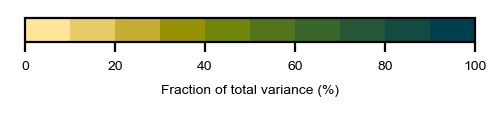

In [13]:
# Instantiate the template with widgets displayed in the sidebar
template = pn.template.MaterialTemplate(
    title="Downscaling and bias-correction uncertainty in CMIP6", sidebar=body_text, header_background="#13294B"
)
# Append a layout to the main area
template.main.append(main)

template.servable()